In [1]:
# import sys
# !{sys.executable} -m pip install plotly

In [2]:
import os
import cv2
import xlsxwriter
import pickle
import numpy as np
import pandas as pd
import seaborn as sn
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from scipy.spatial import distance
from sklearn.ensemble import RandomForestClassifier
from skimage.feature import greycomatrix, greycoprops
from sklearn.metrics import accuracy_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.utils import shuffle
from shutil import copyfile
from skimage.measure import shannon_entropy
from kneed import KneeLocator
from sklearn.svm import SVC
from sklearn.metrics import plot_confusion_matrix
from sklearn.model_selection import cross_validate
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

### Declarations

In [3]:
# data_dir = "../dataset/"

##### Function definitions

In [4]:
def load_data(data_dir):
    m = 0
    X, y, idx, name, fl = [], [], [], [], []
    labels = os.listdir(data_dir)
    for label in labels:
        datas_path = os.path.join(data_dir, label)
        datas = os.listdir(datas_path)
        fl.append(datas)
        for data in datas:
            data_path = os.path.join(datas_path)
            image_name = os.listdir(data_path)
            name.append(image_name)
            for img in image_name:
                img_path = os.path.join(data_path, img)
                image = cv2.imread(img_path)
                X.append(image)
                y.append(label)
                idx.append(m)
                m += 1
    return np.array(X), np.array(y), np.array(idx), name, fl

In [5]:
def preprocessing_glcm(data):
    grays = []
    for i in range(len(data)):
        img = cv2.cvtColor(data[i], cv2.COLOR_BGR2GRAY)
        grays.append(img)
    return grays

In [6]:
def preprocessing_color(array):
    preprocessed=[]
    for i in range(len(array)):
        img = array[i].copy()
        img=cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        preprocessed.append(img)
    return preprocessed

In [7]:
# Function feature extraction with GLCM
def glcm_extraction(data):
    feature = []
    for i in range (0, len(data)):
        distances = [1]
        angles = [0, np.pi/4, np.pi/2, 3/4*(np.pi)] 
        glcm = greycomatrix(data[i], 
                            distances=distances, 
                            angles=angles, 
                            symmetric=True, 
                            normed=True, levels = 256)
        # Haralick Feature
        properties = ['contrast','homogeneity','correlation','ASM']
        feats = np.hstack([greycoprops(glcm, prop).ravel() for prop in properties])
        
        # Entropy feature
        entropy = [shannon_entropy(glcm[:,:,:,idx]) for idx in range(glcm.shape[3])]
        feat = np.concatenate((entropy,feats),axis=0)
        feature.append(feat)
    return feature

In [8]:
# Function feature extraction with Color Histogram
def color_extraction(img):
    features = []           

    for i in range(np.shape(img)[0]):
        hist1 = cv2.calcHist([img[i]], [1], None, [16], [0, 256])
        hist2 = cv2.calcHist([img[i]], [2], None, [16], [0, 256])
        fitur = np.concatenate((hist1,hist2))
        arr = np.array(fitur).flatten()
        features.append(arr)
    return features

##### Cross validation with random forest

In [9]:
def crossVal(K,X,y):
    X,y = shuffle(X, y, random_state = 220)
    clf = RandomForestClassifier(n_estimators=200, random_state=0)
    cv = StratifiedKFold(n_splits=K) 
    scores = cross_val_score(clf, X, y,cv=cv)     
    return scores

In [10]:
def CVSP(K,X,y):
    X,y = shuffle(X, y, random_state = 220)
    clf = RandomForestClassifier(n_estimators=100, random_state=0)
    cv = StratifiedKFold(n_splits=K) 
    scores = cross_val_score(clf, X, y,cv=cv)     
    return scores

In [11]:
def SVM(K,X,y):
    scores = []
    X,y = shuffle(X, y, random_state = 220)
    clf = SVC(C=0.1, gamma= 1, kernel='poly')
    cv = StratifiedKFold(n_splits=K)   
    scores = cross_val_score(clf, X, y,cv=cv)     
    return scores

### Realness

#### Loading data

In [13]:
data, label, idx, img_name, fld = load_data("../dataset/")

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/ipykernel_launcher.py:20: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


In [14]:
print("Total Data:", len(data))

Total Data: 8712


In [15]:
liveness = np.array(np.unique(label, return_counts=True)).T
print("Total data in each class")
liveness

Total data in each class


array([['fake', '4356'],
       ['real', '4356']], dtype='<U21')

##### Sample data for each class

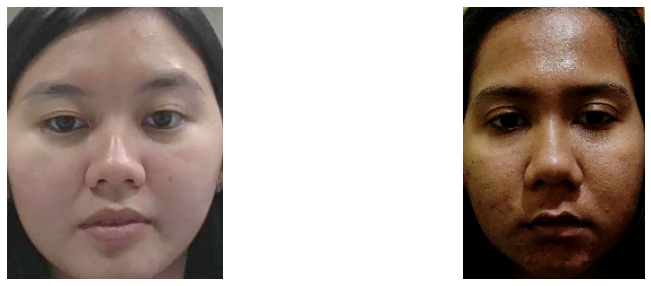

In [16]:
fig, ax = plt.subplots(1, 2, figsize=(15,5))
fig.subplots_adjust(hspace=0.5, wspace=0.1)
for i in range(0,2):
    n = [123,2022]
    fidx = n[i]
    ax[i].imshow(cv2.cvtColor(data[fidx], cv2.COLOR_BGR2RGB))
#     ax[i].set_title(label[i * 490 + (i+4) + 100])
    ax[i].axis('off')
plt.show()

##### Histogram data for liveness

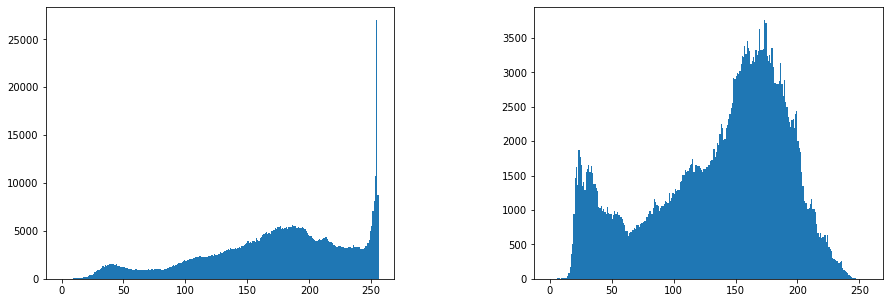

In [17]:
fig, ax1 = plt.subplots(1, 2, figsize=(15,5))
fig.subplots_adjust(hspace=0.5, wspace=0.4)
for i in range(0,2):
    n = [13,182]
    hidx = n[i]
    ax1[i].hist(data[hidx].ravel(), 256, [0,256])
#     ax1[i].set_title(label[i * 490 + (i+4) + 100])
#     ax1[i].axis('off')
plt.show()

##### Preprocessing GLCM

In [18]:
glcm_prep = preprocessing_glcm(data)

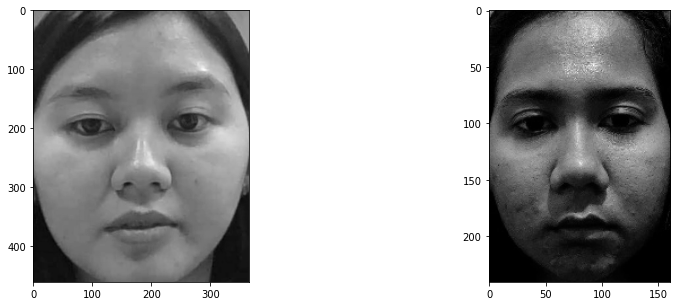

In [19]:
fig, ax = plt.subplots(1, 2, figsize=(15,5))
fig.subplots_adjust(hspace=0.5, wspace=0.1)
for i in range(0,2):
    n = [123,2022]
    gidx = n[i]
    ax[i].imshow(glcm_prep[gidx], cmap=plt.cm.gray)
#     ax[i].set_title(label[i * 490 + (i+4) + 100])
#     ax[i].axis('off')
plt.show()

##### Preprocessing Color Histogram

In [20]:
color_prep = preprocessing_color(data)

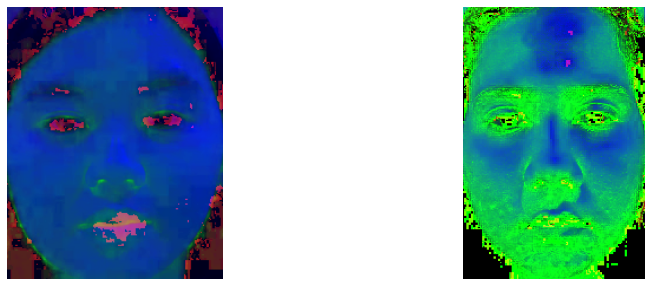

In [21]:
fig, ax = plt.subplots(1, 2, figsize=(15,5))
fig.subplots_adjust(hspace=0.5, wspace=0.1)
for i in range(0,2):
    n = [123,2022]
    cidx = n[i]
    ax[i].imshow(color_prep[cidx], cmap=plt.cm.hsv)
#     ax[i].set_title(label[i * 490 + (i+4) + 100])
    ax[i].axis('off')
plt.show()

#### Feature Extraction

##### GLCM feature extraction

In [22]:
glcm_feat = glcm_extraction(glcm_prep)

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimag

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/skim

In [23]:
print("GLCM ftr length:", len(glcm_feat[0]))

GLCM ftr length: 20


##### Color histogram feature extraction

In [24]:
color_feat = color_extraction(color_prep)

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/numpy/core/fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


In [25]:
print("Color histogram ftr length:", len(color_feat[0]))

Color histogram ftr length: 32


##### Combination

In [26]:
feature = np.concatenate((glcm_feat,color_feat),axis=1)

In [27]:
print("Total for combined:", len(feature[0]))

Total for combined: 52


#### Testing

In [28]:
var = [int(x) for x in np.linspace(start = 2, stop = 20, num = 19)]
k = np.array(var)

#### Testing with random forest

In [29]:
acc_rf = []
for i in range(len(k)):
    a1 = crossVal(k[i],feature,label)
    s1 = np.mean(a1)*100
    acc_rf.append(s1)
    print("Avg Accuracy", str(k[i]),": ",s1)
    i += 1

Avg Accuracy 2 :  100.0
Avg Accuracy 3 :  100.0
Avg Accuracy 4 :  100.0
Avg Accuracy 5 :  100.0
Avg Accuracy 6 :  100.0
Avg Accuracy 7 :  100.0
Avg Accuracy 8 :  100.0
Avg Accuracy 9 :  100.0
Avg Accuracy 10 :  100.0
Avg Accuracy 11 :  100.0
Avg Accuracy 12 :  100.0
Avg Accuracy 13 :  100.0
Avg Accuracy 14 :  100.0
Avg Accuracy 15 :  100.0
Avg Accuracy 16 :  100.0
Avg Accuracy 17 :  100.0
Avg Accuracy 18 :  100.0
Avg Accuracy 19 :  100.0
Avg Accuracy 20 :  100.0


#### Optimal curve

/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/kneed/knee_locator.py:218: RuntimeWarning: invalid value encountered in true_divide
  return (a - min(a)) / (max(a) - min(a))
/Users/dsisains/Documents/Projects/Current/ekyc-2022/liveness-res/color/lib/python3.7/site-packages/kneed/knee_locator.py:242: RuntimeWarning: No local maxima found in the difference curve
The line is probably not polynomial, try plotting
the difference curve with plt.plot(knee.x_difference, knee.y_difference)
Also check that you aren't mistakenly setting the curve argument
  RuntimeWarning,


TypeError: unsupported operand type(s) for -: 'NoneType' and 'int'

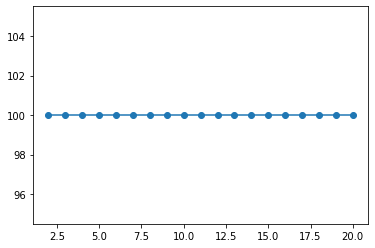

In [30]:
xr = k
yr = acc_rf
# plotting the line 1 points  
plt.plot(k, acc_rf, marker='o', label="Value of k")

# Plotting knee
KLr = KneeLocator(xr, yr, S=1.0, curve='concave', direction='increasing')
elr = KLr.knee-2
ykneer = acc_rf[elr]
xposr = yr.index(ykneer)
xkneer = xr[xposr]
plt.plot(xkneer, ykneer, "ro",label = "Optimum k value")

# naming the x axis 
plt.xlabel('k') 
# naming the y axis 
plt.ylabel('accuracy') 
# giving a title to my graph 
plt.title('Testing value of k on Random Forest') 
plt.legend()
plt.ylim([80, 100])

# function to show the plot 
plt.show() 

print("Optimum k value: ",str(xkneer))

In [ ]:
rf = crossVal(6,feature,label)
print("Avg accuracy based on optimum k value : ",np.mean(rf)*100)

#### Testing with SVM

In [ ]:
acc_svm = []
for i in range(len(k)):
    a2 = SVM(k[i],feature,label)
    s2 = np.mean(a2)*100
    acc_svm.append(s2)
    print("Avg accuracy svm", str(k[i]),": ",s2)
    i += 1

In [ ]:
xs = k
ys = acc_svm
# plotting the line 1 points  
plt.plot(xs, ys, marker='o', label="K value")

# Plotting knee
KLs = KneeLocator(xs, ys, S=1.0, curve='concave', direction='increasing')
els = KLs.knee-2

yknees = acc_svm[els]
xposs = ys.index(yknees)
xknees = xs[xposs]
plt.plot(xknees, yknees, "ro",label = "Optimum k value")

# naming the x axis 
plt.xlabel('k') 
# naming the y axis 
plt.ylabel('accuracy') 
# giving a title to my graph 
plt.title('Testing k value on SVM') 
plt.legend()
plt.ylim([80, 100])
# function to show the plot 
plt.show() 

print("Optimum k value: ",str(xknees))

In [ ]:
svm = SVM(6,feature,label)
print("avg accuracy : ",np.mean(svm)*100)

### Outcome of testing

In [ ]:
nid = []
fl = []
fol = []
fname = []

for i in range(len(img_name)):
    for j in range(0,5):
        nm = img_name[i]
        nm2 = nm[j]
        nid.append(nm2)


for i in range(len(fld)):
    fldb = fld[i]
    for j in range(len(fldb)):
        fo = fldb[j]
        fl.append(fo)
        

for i in range(len(fl)):
    for j in range(0,5):
        bf = fl[i]
        fol.append(bf)

for i in range(len(fol)):
    nms = str(fol[i]) + '_' + str(nid[i])
    fname.append(nms)

In [ ]:
xt, yt, tidx, pred = [], [], [], []
X, y, idx_data = shuffle(feature,label,idx, random_state =220)
clf = RandomForestClassifier(n_estimators=200,random_state=0)
cv = StratifiedKFold(n_splits=6)
X = np.array(X)
y = np.array(y)
scoring = {'acc': 'accuracy',
           'prec_weighted': 'precision_weighted',
           'rec_weighted': 'recall_weighted',
           'f1_weighted': 'f1_weighted'}

In [ ]:
for i in range(len(rf)):
    acf = rf[i] 
    print("Fold #",i+1,':',acf*100)
print("Lowest accuracy",min(rf)*100)

### Confusion matrix

#### Confusion matrix for each fold

In [ ]:
xtra, ytra,traid=[],[],[]
for train_index, test_index in cv.split(X,y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    xtra.append(X_train)          # menyimpan X_test ke dalam array
    ytra.append(y_train)
    traid.append(train_index)
    xt.append(X_test)          # menyimpan X_test ke dalam array
    yt.append(y_test)          # menyimpan y_test ke dalam array
    tidx.append(test_index)    # menyimpan test_index ke dalam array
    pred.append(y_pred)        # menyimpan prediksi ke dalam array 
    plot_confusion_matrix(clf, X_test, y_test,cmap=plt.cm.Blues)
    plt.show()

#### Confusion matrix looking for lowest accuracy

##### 2nd iteration

In [ ]:
l_test = yt[1] 
l_pred = pred[1]
res_data = {'y_Actual': l_test, 'y_Predicted': l_pred}

df = pd.DataFrame(res_data, columns=['y_Actual','y_Predicted'])
confusion_matrix = pd.crosstab(df['y_Actual'], df['y_Predicted'], rownames=['Actual'], colnames=['Predicted'], margins = True)
sn.set(font_scale=1.1) # for label size
plt.figure(figsize=(6,4)) 
sn.heatmap(confusion_matrix, annot=True, annot_kws={"size": 12})
plt.show()

In [ ]:
print("Test data total:",len(l_test),'data')

In [ ]:
acc_min = np.array(np.unique(l_test, return_counts=True)).T
print("data total for each class:")
acc_min

##### 4th iteration

In [ ]:
l_test2 = yt[3] 
l_pred2 = pred[3]
res_data = {'y_Actual': l_test2, 'y_Predicted': l_pred2}

df = pd.DataFrame(res_data, columns=['y_Actual','y_Predicted'])
confusion_matrix = pd.crosstab(df['y_Actual'], df['y_Predicted'], rownames=['Actual'], colnames=['Predicted'], margins = True)
sn.set(font_scale=1.1) # for label size
plt.figure(figsize=(6,4)) 
sn.heatmap(confusion_matrix, annot=True, annot_kws={"size": 12})
plt.show()

In [ ]:
print("total test data:",len(l_test2),'data')

In [ ]:
acc_min = np.array(np.unique(l_test2, return_counts=True)).T
print("total data for each class:")
acc_min

### Classification report 

In [ ]:
sc = cross_validate(clf, X, y, scoring=scoring,cv=cv)

#### Avg accuracy, precision, recall & f1 score

In [ ]:
print("avg accuracy value:",np.mean(sc['test_acc']*100))
print("avg precision weighted:",np.mean(sc['test_prec_weighted']*100))
print("avg recall weighted:",np.mean(sc['test_rec_weighted']*100))
print("avg F1 score weighted:",np.mean(sc['test_f1_weighted']*100))

#### Classification report for each fold

In [ ]:
report = []
for i in range(0,6):
    cr = classification_report(yt[i], pred[i])
    report.append(cr)

In [ ]:
print(report[1])

###### Calssification Report Fold w lowest accuracy

In [ ]:
# 2nd iter
print(classification_report(l_test, l_pred))

In [ ]:
# 4th iter
print(classification_report(l_test2, l_pred2))

### wrongly predicted data

##### 2nd iter

In [ ]:
S_pred = np.asarray(np.where(l_test != l_pred)) #looking for wrongly predicted date
print(S_pred)

In [ ]:
tst_idx = tidx[1]                # test index fold w lowest accuracy 
for i in range(len(S_pred)):
    idv = S_pred[i]      # get index for wrongly predicted 
    act = l_test[idv]    # get actual label from wrongly predicted 
    prd = l_pred[idv]    # get prediction label from wrongly predicted index     
    dt_idx = tst_idx[idv]        # get index data test from test_index
    data_act = idx_data[dt_idx]     # get index data actual form idx_data

In [ ]:
print("total wrongly predicted data:",len(idv),"data")

##### 4th iter

In [ ]:
S_pred2 = np.asarray(np.where(l_test2 != l_pred2))

In [ ]:
tst_idx2 = tidx[3]               
for i in range(len(S_pred2)):
    idv2 = S_pred2[i]    
    act2 = l_test2[idv2]   
    prd2 = l_pred2[idv2]     
    dt_idx2 = tst_idx2[idv2]       
    data_act2 = idx_data[dt_idx2]     

In [ ]:
print("total wrongly predicted data:",len(idv),"data")